In [6]:
# Import all the libraries and dependencies. Use a requirements.txt file to import libraries.

import numpy as np 
import cv2
import matplotlib.pyplot as plt
import os
from filters import sobel_filter # import a predefined function from a module


In [7]:
## Create a function that loops through the folder and loads the images.
input_folder_path = input("Give the absolute path of the folder")
def load_images(input_folder_path):
    
    images = []
    for filename in os.listdir(input_folder_path):
        if filename.endswith(('.jpg', '.png')):
            image_path = os.path.join(input_folder_path, filename)
            
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            images.append(image)
 
    print(f'Images from: {input_folder_path}')      
    return images       

Images from: C:\Users\Anwari\OneDrive\Desktop\Project= Image Processing\Project\Images\TEM39


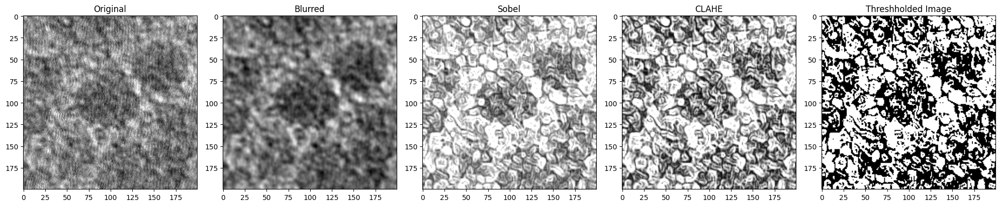

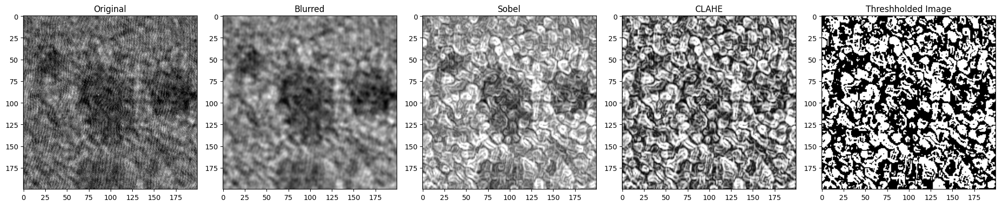

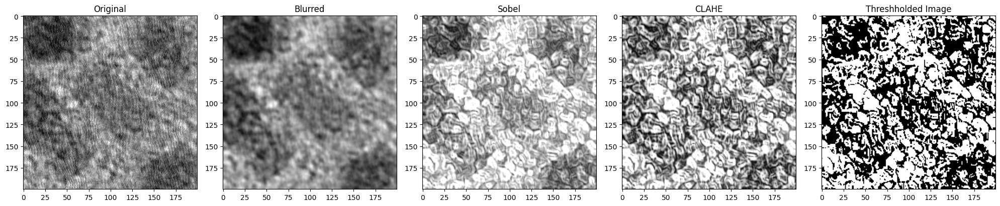

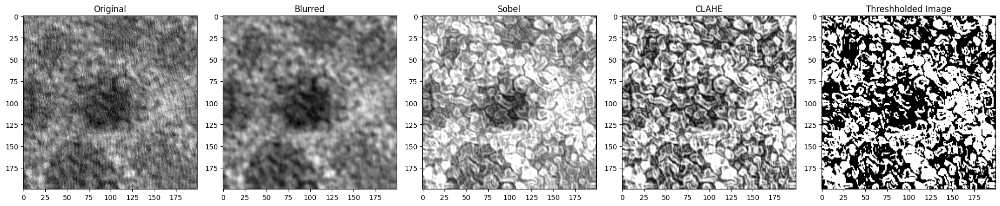

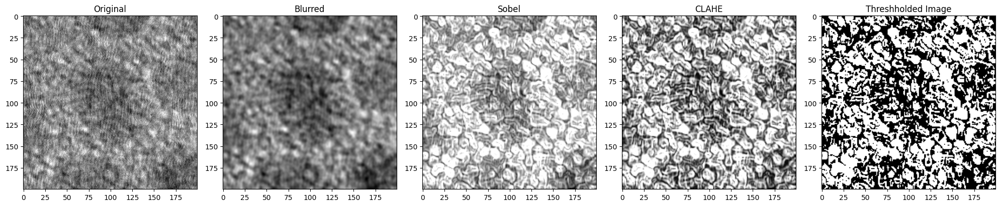

...

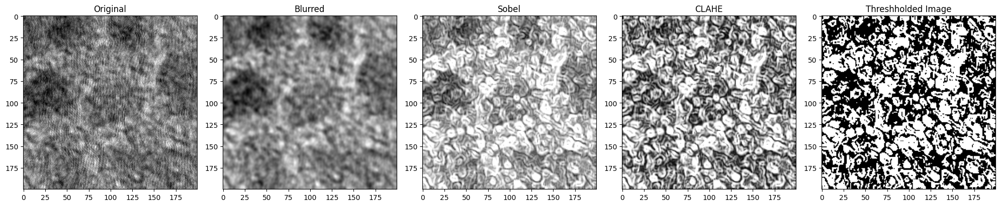

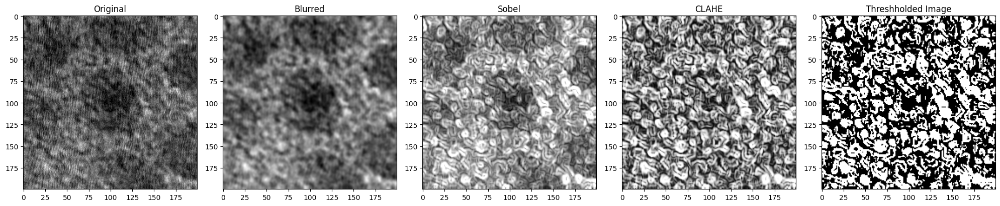

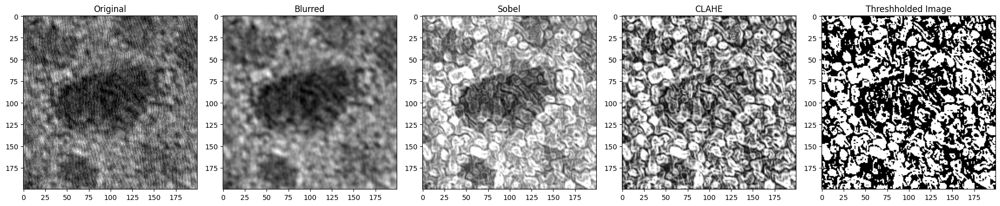

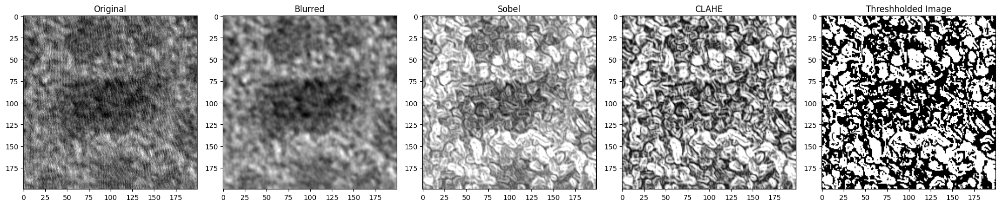

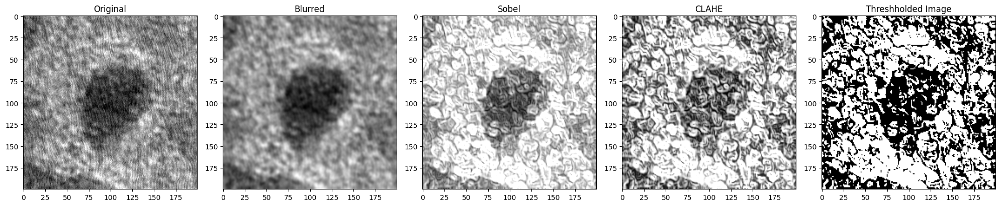

In [16]:
picture = load_images(input_folder_path)
#apply filters to and visualise all images in one go.
counter = 0
for i in picture:
    counter = counter + 1
    #Gaussian Blur to Remove Noise
    picture_blurred = cv2.GaussianBlur(i, (5, 5), 0)

    #Sobel Filter to Enhance Edges
    sobel_image = sobel_filter(picture_blurred)

    #Clahe for adaptive histogram equalization for improved contrast 
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(12, 12))
    contrast_enhanced = clahe.apply(sobel_image)

    #Thresholding to seperate particle from the background
    trval, thresh_img = cv2.threshold(contrast_enhanced, 150, 255, cv2.THRESH_OTSU)

    #Visualization 
    plt.figure(figsize=(20, 5))

    plt.subplot(151)
    plt.imshow(i, cmap = 'gray')
    plt.title("Original")

    plt.subplot(152)
    plt.imshow(picture_blurred, cmap = 'gray')
    plt.title("Blurred")

    plt.subplot(153)
    plt.imshow(sobel_image, cmap = 'gray')
    plt.title("Sobel")

    plt.subplot(154)
    plt.imshow(contrast_enhanced, cmap = 'gray')
    plt.title("CLAHE")

    plt.subplot(155)
    plt.imshow(thresh_img, cmap = 'gray')
    plt.title("Threshholded Image")
    
    plt.tight_layout()
    plt.show()

In [9]:


contours, _ = cv2.findContours(thresh_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

image_center = ((thresh_img.shape[1])//2 , (thresh_img.shape[0])//2)
##binary_image.shape[1] gives the width of the image, and binary_image.shape[0] gives the height.
##Dividing each by 2 (// 2) gives the x and y coordinates of the center point, respectively.
